# Generating Speech Commands adversarial examples with AdvGAN

In [ ]:
!pip install pydub
!pip install tensorflow-io==0.25.0

!pip install git+https://github.com/tensorflow/docs
!pip install git+https://www.github.com/keras-team/keras-contrib.git

In [ ]:
import os
import time

import matplotlib.pyplot as plt
import numpy as np

import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_io as tfio

from callbacks import AudioAdvGANCallback
from losses import carlini_wagner_loss_fn, l2_norm_soft_hinge_loss_fn
from models.advgan import AdvGAN
from models.target import SCConvTarget

from models.components import (
    get_speech_commands_adv_generator,
    get_speech_commands_adv_discriminator
)

from util import (
    images_to_gif,
    generate_adv_examples,
    plot_audio_results,
    plot_confusion_matrix
)

In [ ]:
AUDIO_DIR = 'audio'
WEIGHTS_DIR = 'weights'

BASE_FILENAME = 'advgan_sc'

In [ ]:
if not os.path.isdir(AUDIO_DIR):
    os.makedirs(AUDIO_DIR)

if not os.path.isdir(WEIGHTS_DIR):
    os.makedirs(WEIGHTS_DIR)

In [ ]:
TARGET_LABEL = 'up'  # the chosen label for the targeted attack

BATCH_SIZE = 128

INPUT_SHAPE = (8192, 1)
OUTPUT_CHANNELS = 1

In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-2a04ae4c-a523-fc01-62b3-e995a599c0ff)


## Data loading and preprocessing

In [ ]:
(train_data, test_data), info = tfds.load(
    'speech_commands',
    split=['train', 'test'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True,
)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/speech_commands/0.0.2.incompleteL58NK4/speech_commands-train.tfrecord


  0%|          | 0/85511 [00:00<?, ? examples/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/speech_commands/0.0.2.incompleteL58NK4/speech_commands-validation.tfrecord


  0%|          | 0/10102 [00:00<?, ? examples/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/speech_commands/0.0.2.incompleteL58NK4/speech_commands-test.tfrecord


  0%|          | 0/4890 [00:00<?, ? examples/s]

Dataset speech_commands downloaded and prepared to /root/tensorflow_datasets/speech_commands/0.0.2. Subsequent calls will reuse this data.


Create a function for filtering out samples labeled as `_silence_`, `_unknown_` or `TARGET_LABEL`:

In [ ]:
labels_to_remove = [
    info.features['label'].str2int('_silence_'),
    info.features['label'].str2int('_unknown_'),
    info.features['label'].str2int(TARGET_LABEL)
]

def label_filter(audio, label):
    return tf.reduce_all(tf.not_equal(label, labels_to_remove))

Create a function for normalizing audio tensors to $[-1.0, 1.0]$:

In [ ]:
def normalize(audio, label):
    return tf.cast(audio, tf.float32) / 32768.0, label

Create a function for resampling audio files from 16 kHZ to 8192 Hz:

In [ ]:
rate_in = 16000
rate_out = INPUT_SHAPE[0]

def resample(audio, label):
    return tfio.audio.resample(audio, rate_in, rate_out), label

Create a function for padding audio tensors with zeroes so that they are all of the same length:

In [ ]:
max_length = rate_out

def pad(audio, label):
    paddings = [[0, max_length - tf.shape(audio)[0]]]
    padded_audio = tf.pad(audio, paddings, 'CONSTANT', constant_values=0)

    return padded_audio, label

Create a function for reshaping audio tensors from `(8192,)` to `(8192, 1)`:

In [ ]:
def reshape(audio, label):
    return audio[..., tf.newaxis], label

Preprocess the datasets:

In [ ]:
def preprocess(dataset):
    return dataset.filter(
        label_filter
    ).map(
        normalize,
        num_parallel_calls=tf.data.AUTOTUNE
    ).map(
        resample,
        num_parallel_calls=tf.data.AUTOTUNE
    ).map(
        pad,
        num_parallel_calls=tf.data.AUTOTUNE
    ).map(
        reshape,
        num_parallel_calls=tf.data.AUTOTUNE
    )

In [ ]:
train_data = preprocess(train_data)
test_data = preprocess(test_data)

Create a function that will be used to transform target model inputs to 2D spectrograms:

In [ ]:
def to_spectrogram(inputs):
    spectrograms = tfio.audio.spectrogram(
        tf.squeeze(inputs, axis=-1),
        nfft=None,
        window=165,
        stride=65
    )

    return tf.expand_dims(spectrograms, axis=-1)

## AdvGAN

[AdvGAN](https://arxiv.org/pdf/1801.02610.pdf) is a generative adversarial network for creating adversarial examples that is based on image-to-image translation models such as [pix2pix](https://openaccess.thecvf.com/content_cvpr_2017/papers/Isola_Image-To-Image_Translation_With_CVPR_2017_paper.pdf) and [CycleGAN](https://openaccess.thecvf.com/content_ICCV_2017/papers/Zhu_Unpaired_Image-To-Image_Translation_ICCV_2017_paper.pdf).

It consists of three parts: the generator, the discriminator, and the target of the adversarial attacks.

The generator creates adversarial perturbations of audio samples, while the discriminator tries to distinguish between original and adversarial audio samples.

The target network is used for computing the adversarial loss, which guides the generator during training towards creating more successful adversarial images.

### Generator

The generator is based on the architecture described in the original [SpeechAdvGAN](https://ieeexplore.ieee.org/abstract/document/9129727) paper. It is adjusted to work with audio files resampled to 8192 Hz by dividing all filters by 2.

In [ ]:
generator = get_speech_commands_adv_generator(
    INPUT_SHAPE,
    encoder_filters=(8, 16, 16, 32, 32, 64, 64, 128),
    decoder_filters=(64, 64, 32, 32, 16, 16, 8, 1)
)

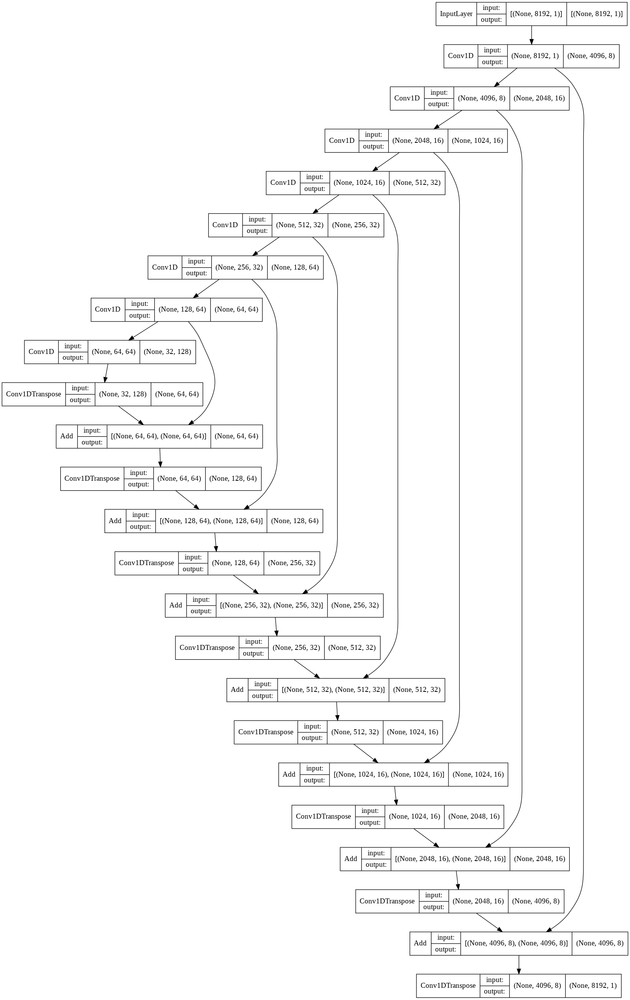

In [ ]:
tf.keras.utils.plot_model(generator, show_shapes=True, show_layer_names=False)

### Discriminator

The discriminator is a CNN-based binary classifier that tries to differentiate between real commands (from the training set) and fake commands (created by the generator). It is also a modified version of the model described in the [SpeechAdvGAN](https://ieeexplore.ieee.org/abstract/document/9129727) paper (filters divided by 2).

In [ ]:
discriminator = get_speech_commands_adv_discriminator(
    INPUT_SHAPE,
    filters=(16, 32, 32, 64, 64, 128, 128, 256, 256, 512, 1024)
)

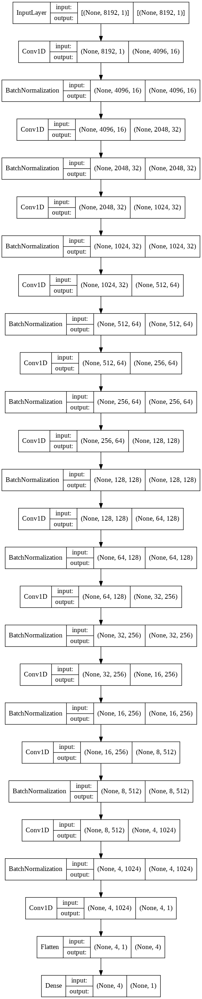

In [ ]:
tf.keras.utils.plot_model(discriminator, show_shapes=True, show_layer_names=False)

### Target

The pre-trained `SCConvTarget` model is the target of the attacks.
It is used for computing the adversarial loss, which guides the generator during training.

In [ ]:
target = SCConvTarget(transform_fn=to_spectrogram)

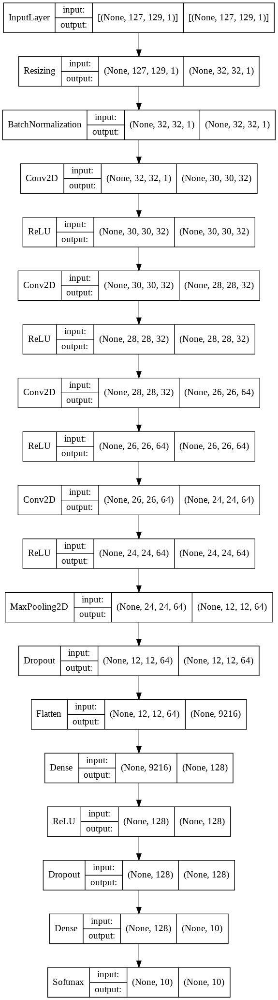

In [ ]:
target.model.build((None, 127, 129, 1))
tf.keras.utils.plot_model(target.model, show_shapes=True, show_layer_names=False)

In [ ]:
weights_path = f'{WEIGHTS_DIR}/speech_commands_target_20220419161057.h5'

target.built = True
target.load_weights(weights_path)

### Training

In each training step, the generator receives a batch of training set images $\mathbf{x}$ as input and uses it to generate a batch of adversarial perturbations $G(\mathbf{x})$.
The adversarial images are obtained by combining the training set images with the perturbations: $\mathbf{x}_{adv} = \mathbf{x} + G(\mathbf{x})$ (making sure that the values remain in $[-1, 1]$).

The target model classifies the adversarial images, and the resulting class probabilities $f(\mathbf{x}_{adv})$ are used for calculating the adversarial loss.

The discriminator is then used to classify real images (from the training set) and adversarial images (produced by the generator).

The loss is calculated for the discriminator and the generator respectively, and the resulting gradients are used to update them.

#### Discriminator loss

The discriminator's loss quantifies how well it distinguishes between real images $\mathbf{x}$ and generated images $\mathbf{x} + G(\mathbf{x})$.
As such, it is a sum of the losses computed on the real and fake outputs:

$\mathcal{L}_D = \mathcal{L_{D,\mathrm{real}}} + \mathcal{L_{D,\mathrm{fake}}}$

For the real component, the discriminator's predictions are compared to an array of 1s, and for the fake outputs to an array of 0s:

$\mathcal{L_{D,\mathrm{real}}} = BCE(\mathbf{1}, D(\mathbf{x}))$

$\mathcal{L_{D,\mathrm{fake}}} = BCE(\mathbf{0}, D(\mathbf{x} + G(\mathbf{x})))$,

where $BCE$ stands for the binary cross-entropy loss function.

#### Generator loss

In the adversarial attack setting, the generator loss $\mathcal{L}_G$, besides quantifying how well the generator fools the discriminator, also needs to quantify the successfulness of the generated adversarial images (i.e. how well do they fool the target into classifying them as the desired target label $t$).

The adversarial component of the loss is calculated according to the formula found in [Carlini and Wagner (2017b)](https://nicholas.carlini.com/papers/2017_sp_nnrobustattacks.pdf).
For a single adversarial image $x_{adv}$ and the corresponding class probabilities obtained from the target model $f(x_{adv})$, the adversarial loss is given as:

$\mathcal{L_{x_{adv}}} = \mathrm{max}(\mathrm{max}_{i \ne t} f(x_{adv})_i - f(x_{adv})_t,\ 0)$

Since we are training on batches of data, the final adversarial loss $\mathcal{L_{adv}}$ is a sum of all the individual adversarial losses for the adversarial images generated in the batch.

Additionally, a soft hinge loss on the L2 norm of the perturbations is added to bound their magnitude. For a single adversarial perturbation:

$\mathcal{L}_{perturb, x} = \mathrm{max}(||G(x)||_2 - \mathrm{bound}, 0)$,

where $\mathrm{bound}$ is a user-specified parameter (e.g. $0.3$).
Again, because we are dealing with batched data, the final perturbation loss $\mathcal{L}_{perturb}$ is a mean of all the individual perturbation losses for the batch.

The total generator loss is then:

$\mathcal{L}_G = \mathcal{L_{adv}} + \lambda_{gan}BCE(\mathbf{1}, D(\mathbf{x} + G(\mathbf{x}))) + \lambda_{perturb}\mathcal{L}_{perturb}$,

where $\lambda_{gan}$ and $\lambda_{perturb}$ are user-defined parameters that control the importance of the original generator loss and perturbation loss respectively.

In [ ]:
train_audio = [audio for audio, _ in train_data]

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices(train_audio).batch(BATCH_SIZE).cache().prefetch(tf.data.AUTOTUNE)

Create the `AdvGAN` model:

In [ ]:
advgan = AdvGAN(
    target=target,
    discriminator=discriminator,
    generator=generator
)

Compile the model by adding the respective optimizers (two are needed because the discriminator and generator train seperately), the loss functions, and the $\lambda$ parameters:

Note that `from_logits` needs to be set to `True` as the discriminator outputs logits instead of probabilities.

In [ ]:
PERTURB_BOUND = None

advgan.compile(
    d_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),

    loss_fn=tf.keras.losses.BinaryCrossentropy(from_logits=True, label_smoothing=0.1),
    adv_loss_fn=carlini_wagner_loss_fn(target_label=info.features['label'].str2int(TARGET_LABEL)),
    perturb_loss_fn=l2_norm_soft_hinge_loss_fn(bound=0.1),

    lambda_gan=1,
    lambda_perturb=1,
    perturb_bound=PERTURB_BOUND,
)

Create a callback that periodically saves generated audio examples:


In [ ]:
sample = tf.convert_to_tensor(train_audio[:5])

callback = AudioAdvGANCallback(
    real_audios=sample,
    sample_rate=INPUT_SHAPE[0],
    path_prefix=f'{AUDIO_DIR}/{BASE_FILENAME}',
    perturb_bound=PERTURB_BOUND
)

Epoch 1/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2009 - g_loss: 4.7135 - g_gan_loss: 2.5552 - g_adv_loss: 0.1721 - g_perturb_loss: 1.9862

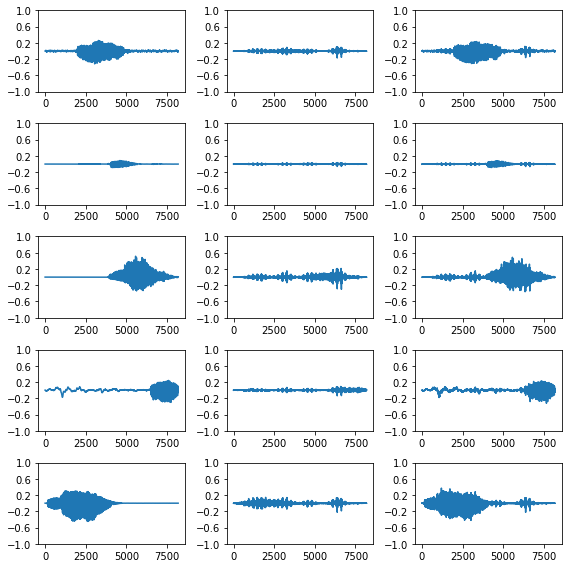

218/218 [==============================] - 117s 536ms/step - d_loss: 0.2009 - g_loss: 4.7144 - g_gan_loss: 2.5558 - g_adv_loss: 0.1713 - g_perturb_loss: 1.9873
Epoch 2/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1993 - g_loss: 4.6708 - g_gan_loss: 2.7458 - g_adv_loss: 0.1074 - g_perturb_loss: 1.8177

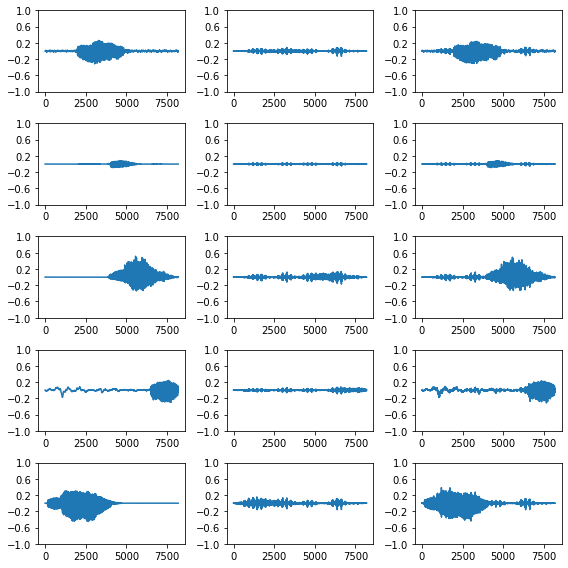

218/218 [==============================] - 116s 533ms/step - d_loss: 0.1993 - g_loss: 4.6715 - g_gan_loss: 2.7461 - g_adv_loss: 0.1069 - g_perturb_loss: 1.8185
Epoch 3/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1991 - g_loss: 4.5609 - g_gan_loss: 2.8124 - g_adv_loss: 0.1355 - g_perturb_loss: 1.6131

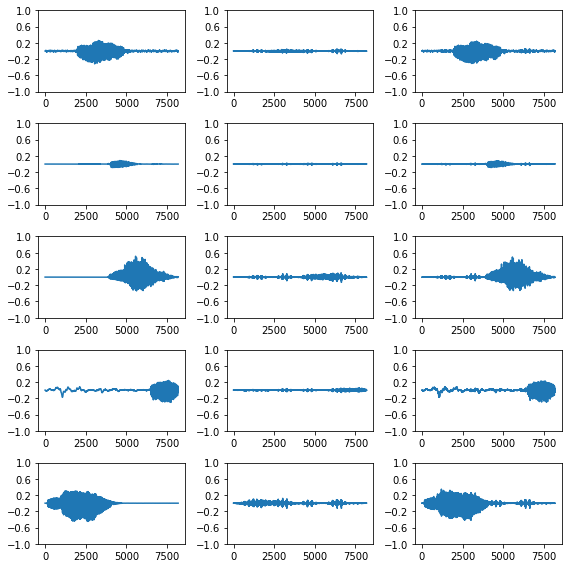

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1991 - g_loss: 4.5595 - g_gan_loss: 2.8124 - g_adv_loss: 0.1349 - g_perturb_loss: 1.6123
Epoch 4/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1991 - g_loss: 4.5412 - g_gan_loss: 2.8322 - g_adv_loss: 0.1241 - g_perturb_loss: 1.5849

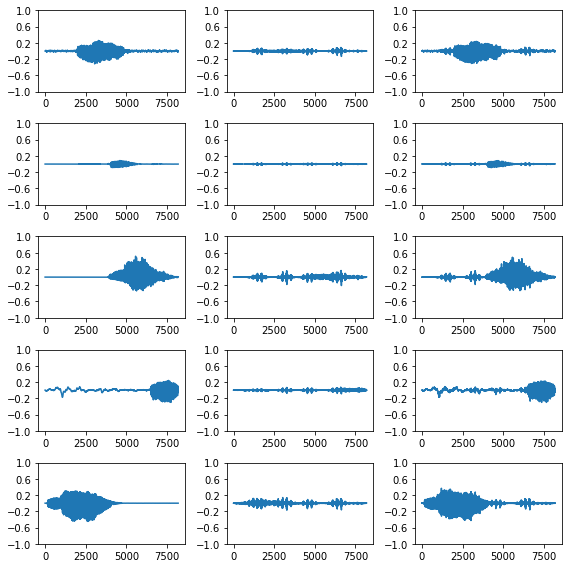

218/218 [==============================] - 117s 535ms/step - d_loss: 0.1991 - g_loss: 4.5417 - g_gan_loss: 2.8323 - g_adv_loss: 0.1235 - g_perturb_loss: 1.5859
Epoch 5/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1990 - g_loss: 4.4144 - g_gan_loss: 2.8337 - g_adv_loss: 0.1333 - g_perturb_loss: 1.4474

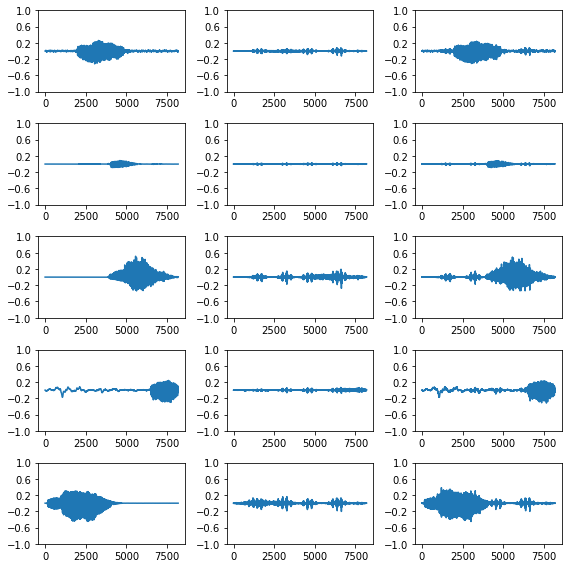

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1990 - g_loss: 4.4159 - g_gan_loss: 2.8338 - g_adv_loss: 0.1327 - g_perturb_loss: 1.4495
Epoch 6/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1990 - g_loss: 4.3126 - g_gan_loss: 2.8426 - g_adv_loss: 0.0949 - g_perturb_loss: 1.3751

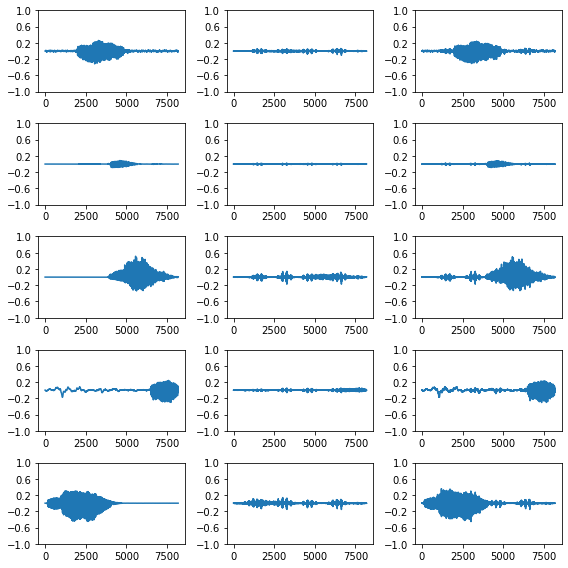

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1990 - g_loss: 4.3130 - g_gan_loss: 2.8425 - g_adv_loss: 0.0945 - g_perturb_loss: 1.3760
Epoch 7/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1991 - g_loss: 4.4264 - g_gan_loss: 2.8402 - g_adv_loss: 0.1152 - g_perturb_loss: 1.4710

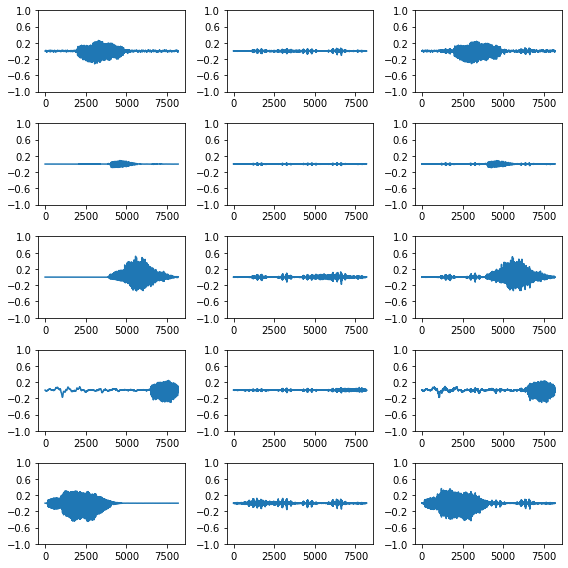

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1991 - g_loss: 4.4261 - g_gan_loss: 2.8401 - g_adv_loss: 0.1147 - g_perturb_loss: 1.4713
Epoch 8/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1989 - g_loss: 4.2241 - g_gan_loss: 2.8391 - g_adv_loss: 0.1129 - g_perturb_loss: 1.2721

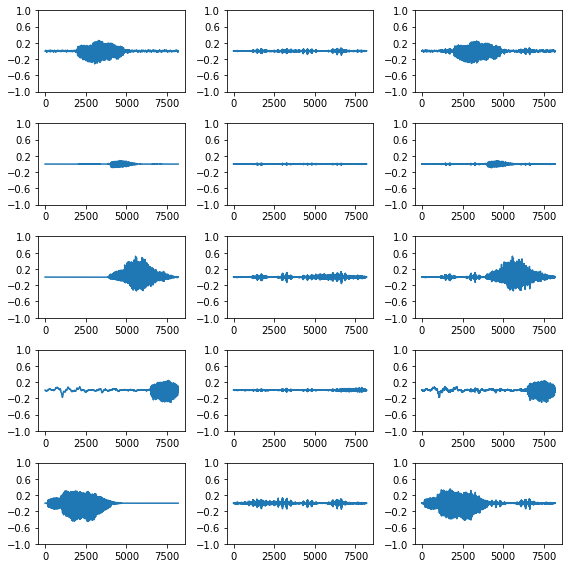

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1989 - g_loss: 4.2250 - g_gan_loss: 2.8390 - g_adv_loss: 0.1124 - g_perturb_loss: 1.2736
Epoch 9/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1988 - g_loss: 4.3803 - g_gan_loss: 2.8471 - g_adv_loss: 0.1183 - g_perturb_loss: 1.4149

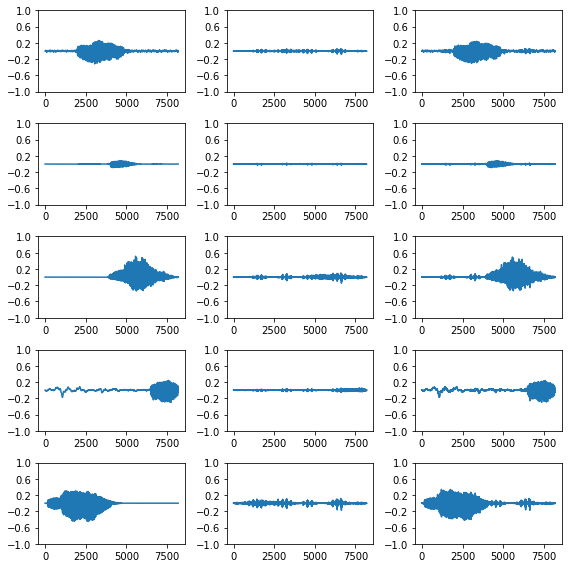

218/218 [==============================] - 117s 536ms/step - d_loss: 0.1988 - g_loss: 4.3794 - g_gan_loss: 2.8470 - g_adv_loss: 0.1178 - g_perturb_loss: 1.4146
Epoch 10/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1988 - g_loss: 4.2334 - g_gan_loss: 2.8466 - g_adv_loss: 0.0978 - g_perturb_loss: 1.2890

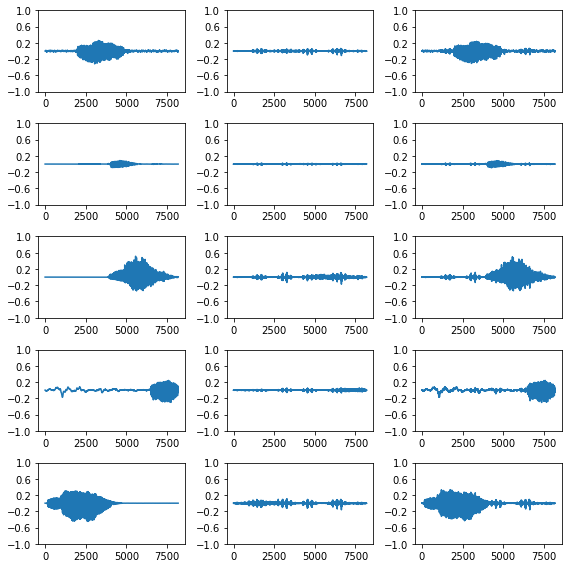

218/218 [==============================] - 117s 535ms/step - d_loss: 0.1988 - g_loss: 4.2337 - g_gan_loss: 2.8466 - g_adv_loss: 0.0973 - g_perturb_loss: 1.2898
Epoch 11/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 4.2014 - g_gan_loss: 2.8481 - g_adv_loss: 0.1015 - g_perturb_loss: 1.2517

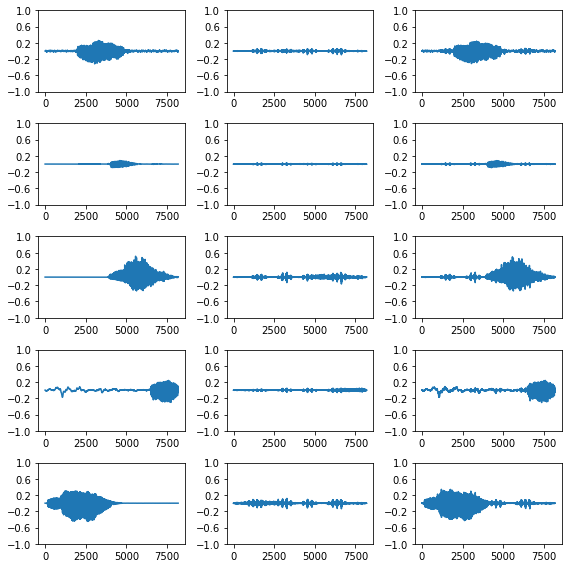

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1987 - g_loss: 4.2017 - g_gan_loss: 2.8481 - g_adv_loss: 0.1010 - g_perturb_loss: 1.2526
Epoch 12/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 4.2714 - g_gan_loss: 2.8482 - g_adv_loss: 0.0815 - g_perturb_loss: 1.3418

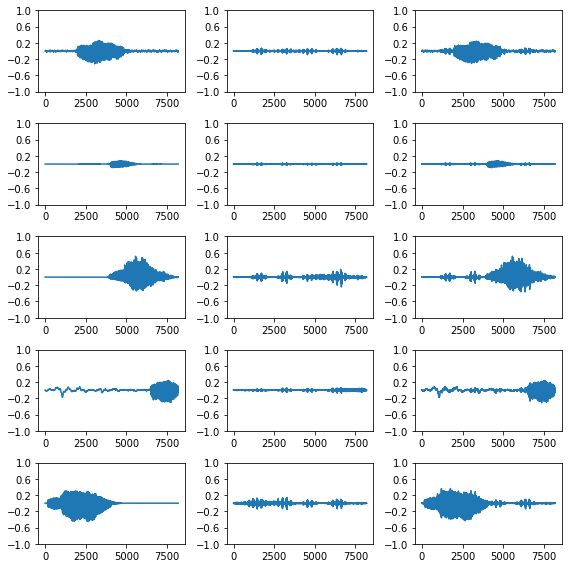

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1987 - g_loss: 4.2725 - g_gan_loss: 2.8481 - g_adv_loss: 0.0811 - g_perturb_loss: 1.3433
Epoch 13/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 4.1072 - g_gan_loss: 2.8465 - g_adv_loss: 0.0817 - g_perturb_loss: 1.1789

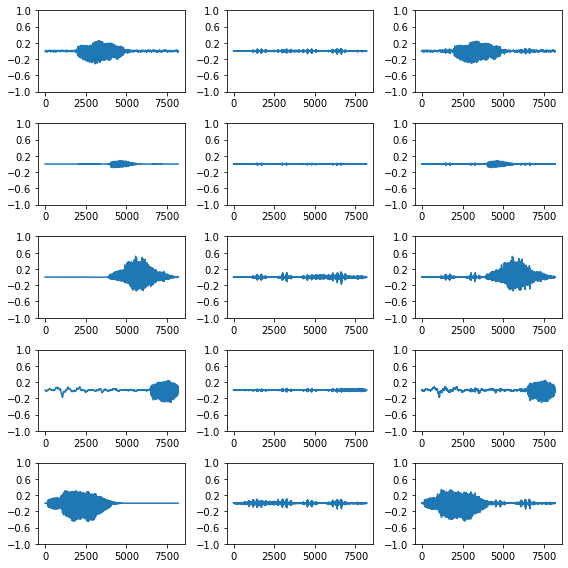

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1987 - g_loss: 4.1075 - g_gan_loss: 2.8465 - g_adv_loss: 0.0813 - g_perturb_loss: 1.1797
Epoch 14/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1988 - g_loss: 4.0460 - g_gan_loss: 2.8447 - g_adv_loss: 0.1115 - g_perturb_loss: 1.0897

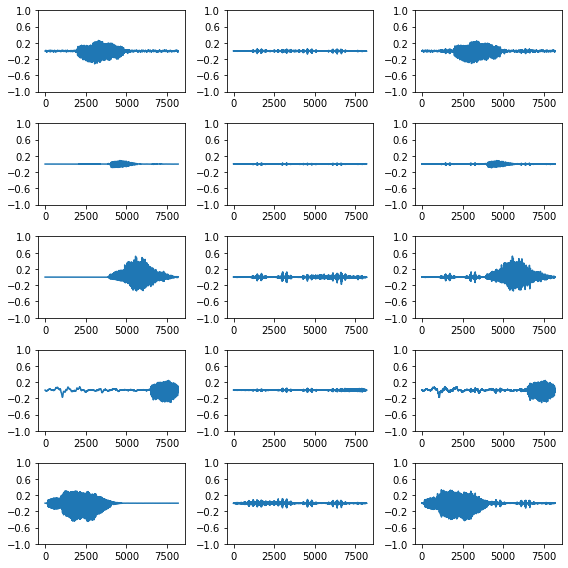

218/218 [==============================] - 116s 534ms/step - d_loss: 0.1988 - g_loss: 4.0467 - g_gan_loss: 2.8446 - g_adv_loss: 0.1110 - g_perturb_loss: 1.0910
Epoch 15/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1989 - g_loss: 4.0712 - g_gan_loss: 2.8444 - g_adv_loss: 0.0961 - g_perturb_loss: 1.1307

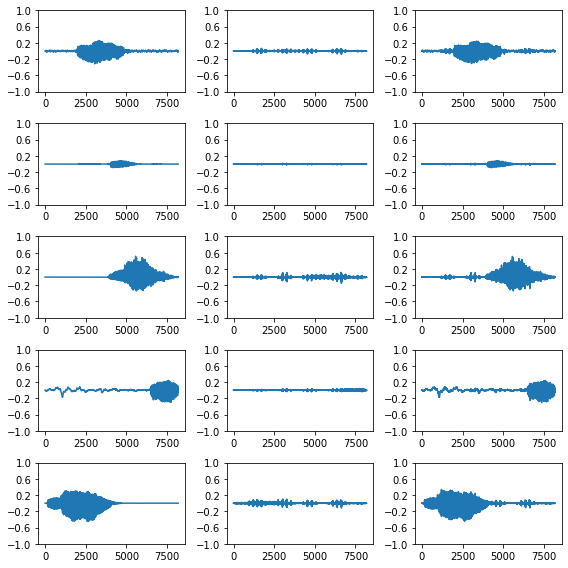

218/218 [==============================] - 117s 537ms/step - d_loss: 0.1989 - g_loss: 4.0712 - g_gan_loss: 2.8443 - g_adv_loss: 0.0956 - g_perturb_loss: 1.1313
Epoch 16/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1989 - g_loss: 4.2319 - g_gan_loss: 2.8468 - g_adv_loss: 0.1095 - g_perturb_loss: 1.2757

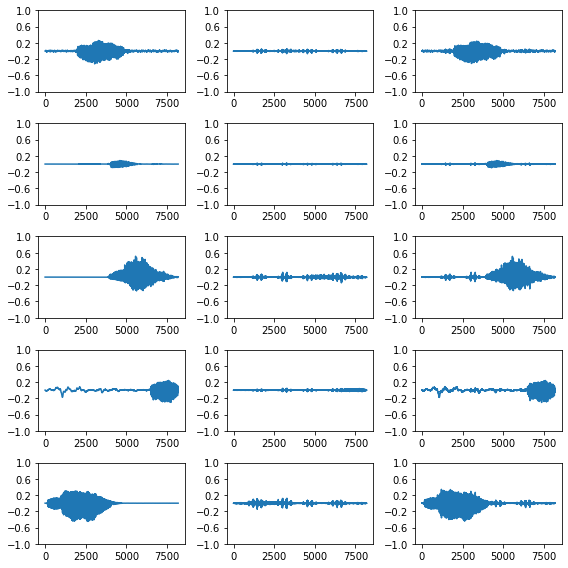

218/218 [==============================] - 116s 534ms/step - d_loss: 0.1989 - g_loss: 4.2314 - g_gan_loss: 2.8467 - g_adv_loss: 0.1090 - g_perturb_loss: 1.2758
Epoch 17/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 4.0388 - g_gan_loss: 2.8452 - g_adv_loss: 0.0793 - g_perturb_loss: 1.1144

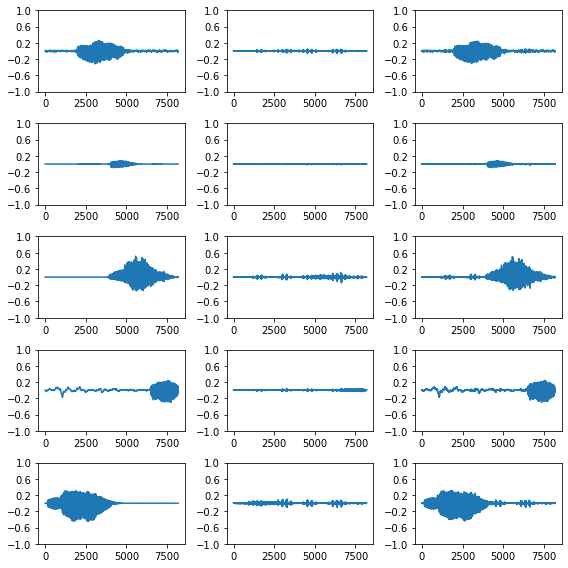

218/218 [==============================] - 117s 535ms/step - d_loss: 0.1987 - g_loss: 4.0382 - g_gan_loss: 2.8450 - g_adv_loss: 0.0789 - g_perturb_loss: 1.1142
Epoch 18/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 4.0791 - g_gan_loss: 2.8483 - g_adv_loss: 0.0774 - g_perturb_loss: 1.1534

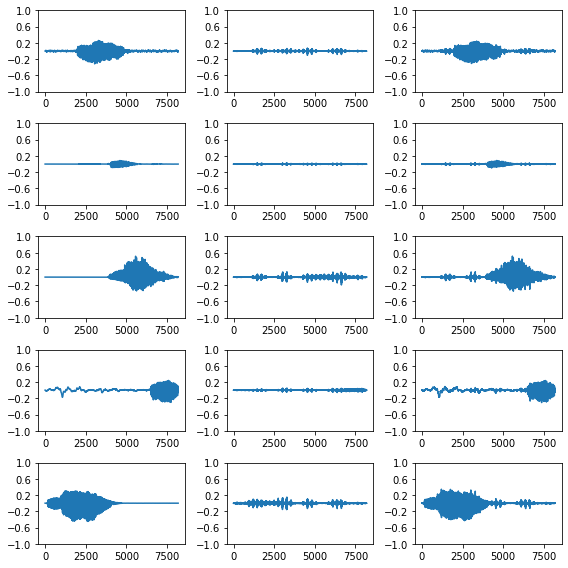

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1987 - g_loss: 4.0803 - g_gan_loss: 2.8482 - g_adv_loss: 0.0770 - g_perturb_loss: 1.1550
Epoch 19/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 4.0104 - g_gan_loss: 2.8483 - g_adv_loss: 0.0728 - g_perturb_loss: 1.0893

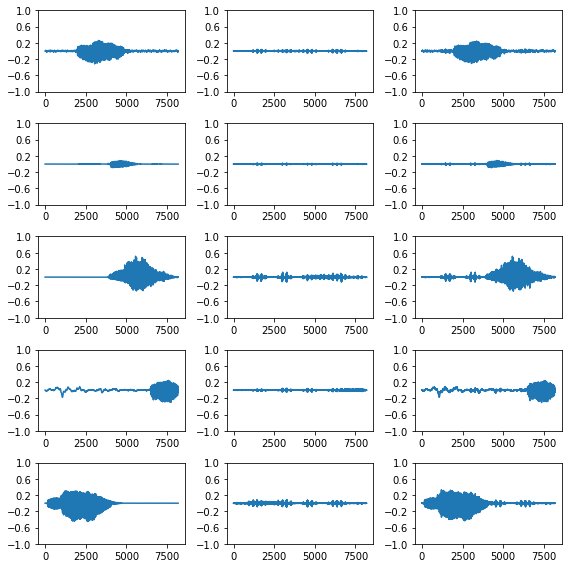

218/218 [==============================] - 116s 533ms/step - d_loss: 0.1986 - g_loss: 4.0107 - g_gan_loss: 2.8483 - g_adv_loss: 0.0725 - g_perturb_loss: 1.0900
Epoch 20/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 4.0220 - g_gan_loss: 2.8482 - g_adv_loss: 0.0597 - g_perturb_loss: 1.1141

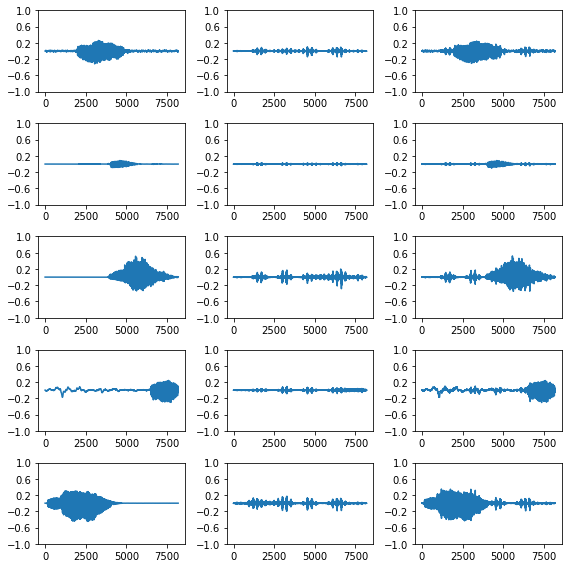

218/218 [==============================] - 117s 537ms/step - d_loss: 0.1986 - g_loss: 4.0252 - g_gan_loss: 2.8482 - g_adv_loss: 0.0594 - g_perturb_loss: 1.1176
Epoch 21/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 4.0006 - g_gan_loss: 2.8486 - g_adv_loss: 0.0735 - g_perturb_loss: 1.0786

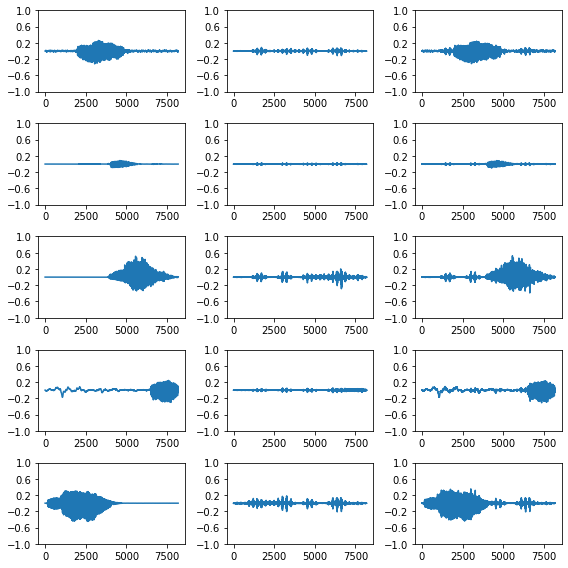

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1986 - g_loss: 4.0038 - g_gan_loss: 2.8486 - g_adv_loss: 0.0731 - g_perturb_loss: 1.0821
Epoch 22/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.9832 - g_gan_loss: 2.8480 - g_adv_loss: 0.0528 - g_perturb_loss: 1.0824

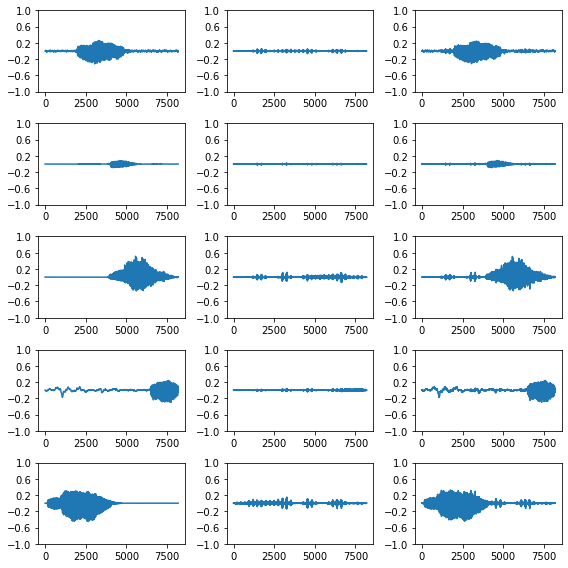

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1986 - g_loss: 3.9839 - g_gan_loss: 2.8480 - g_adv_loss: 0.0526 - g_perturb_loss: 1.0833
Epoch 23/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 4.0041 - g_gan_loss: 2.8484 - g_adv_loss: 0.0732 - g_perturb_loss: 1.0825

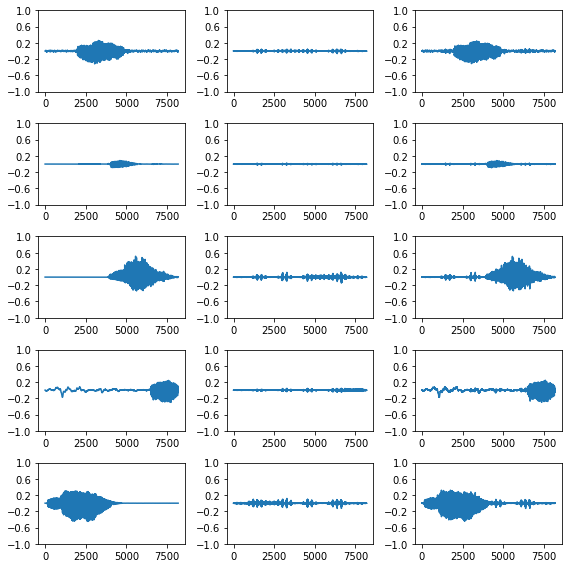

218/218 [==============================] - 116s 534ms/step - d_loss: 0.1986 - g_loss: 4.0044 - g_gan_loss: 2.8484 - g_adv_loss: 0.0729 - g_perturb_loss: 1.0831
Epoch 24/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.9861 - g_gan_loss: 2.8481 - g_adv_loss: 0.0736 - g_perturb_loss: 1.0645

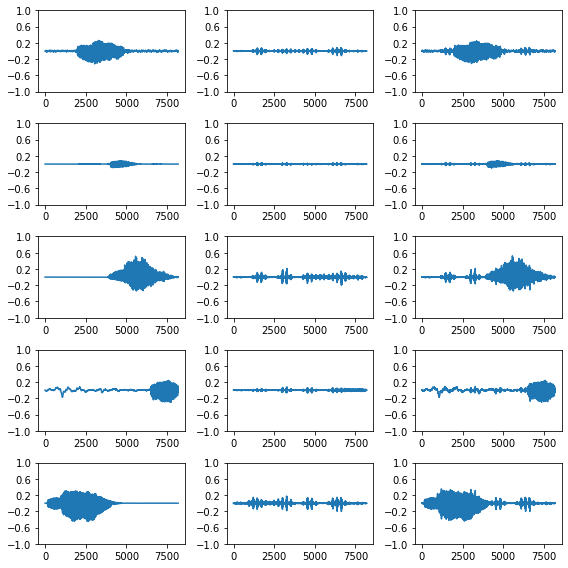

218/218 [==============================] - 116s 534ms/step - d_loss: 0.1986 - g_loss: 3.9886 - g_gan_loss: 2.8481 - g_adv_loss: 0.0732 - g_perturb_loss: 1.0674
Epoch 25/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 4.0762 - g_gan_loss: 2.8483 - g_adv_loss: 0.0745 - g_perturb_loss: 1.1534

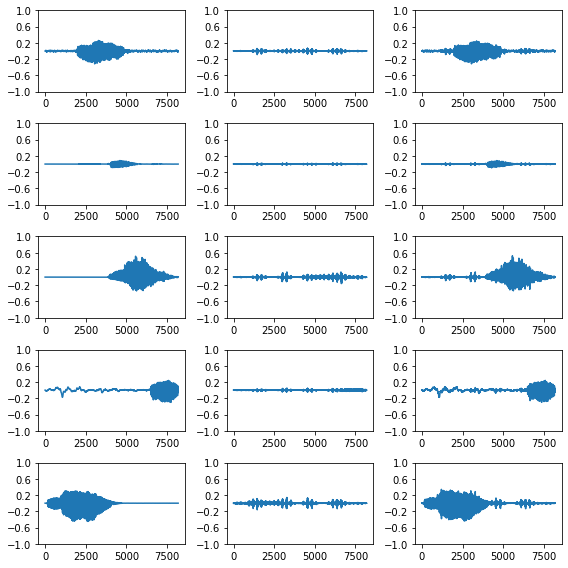

218/218 [==============================] - 117s 535ms/step - d_loss: 0.1986 - g_loss: 4.0771 - g_gan_loss: 2.8483 - g_adv_loss: 0.0742 - g_perturb_loss: 1.1546
Epoch 26/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.9829 - g_gan_loss: 2.8474 - g_adv_loss: 0.0565 - g_perturb_loss: 1.0791

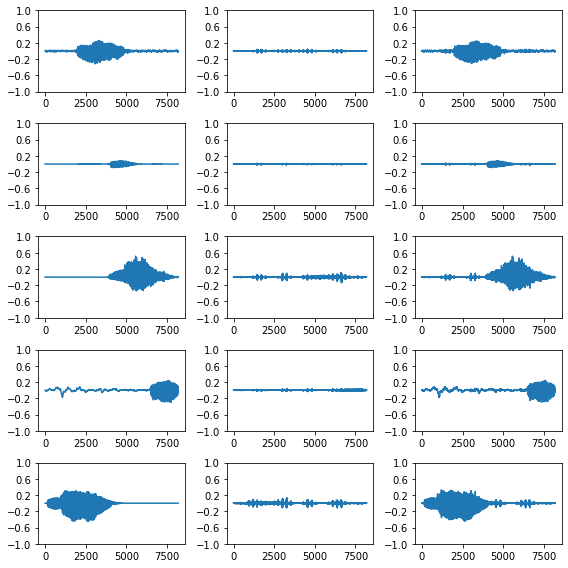

218/218 [==============================] - 117s 536ms/step - d_loss: 0.1986 - g_loss: 3.9829 - g_gan_loss: 2.8473 - g_adv_loss: 0.0562 - g_perturb_loss: 1.0794
Epoch 27/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 3.9478 - g_gan_loss: 2.8414 - g_adv_loss: 0.0642 - g_perturb_loss: 1.0422

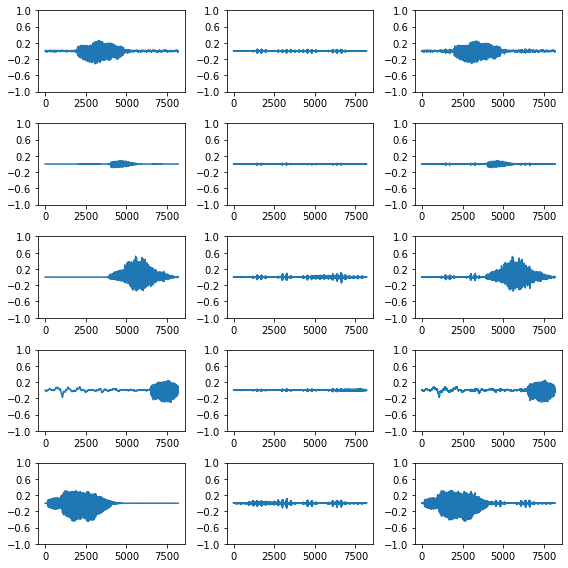

218/218 [==============================] - 117s 535ms/step - d_loss: 0.1987 - g_loss: 3.9477 - g_gan_loss: 2.8415 - g_adv_loss: 0.0639 - g_perturb_loss: 1.0423
Epoch 28/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 3.9246 - g_gan_loss: 2.8494 - g_adv_loss: 0.0769 - g_perturb_loss: 0.9982

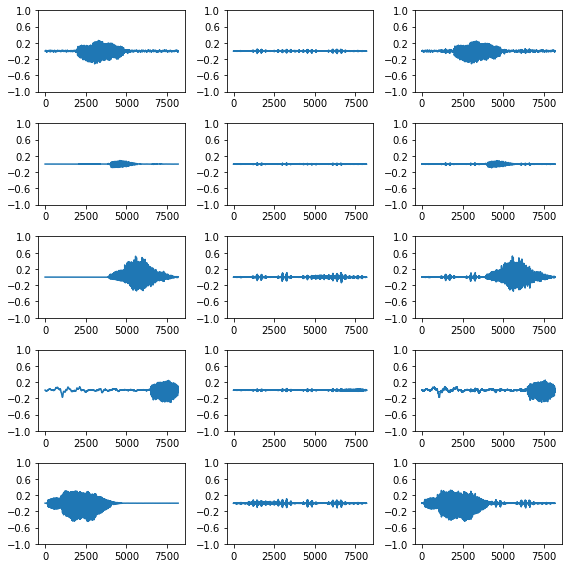

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1987 - g_loss: 3.9249 - g_gan_loss: 2.8494 - g_adv_loss: 0.0766 - g_perturb_loss: 0.9989
Epoch 29/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 3.8890 - g_gan_loss: 2.8493 - g_adv_loss: 0.0618 - g_perturb_loss: 0.9779

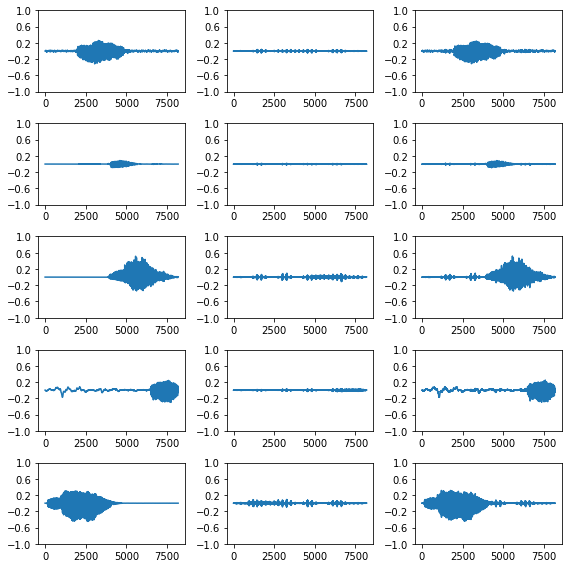

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1987 - g_loss: 3.8890 - g_gan_loss: 2.8493 - g_adv_loss: 0.0615 - g_perturb_loss: 0.9783
Epoch 30/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 3.9821 - g_gan_loss: 2.8482 - g_adv_loss: 0.0670 - g_perturb_loss: 1.0669

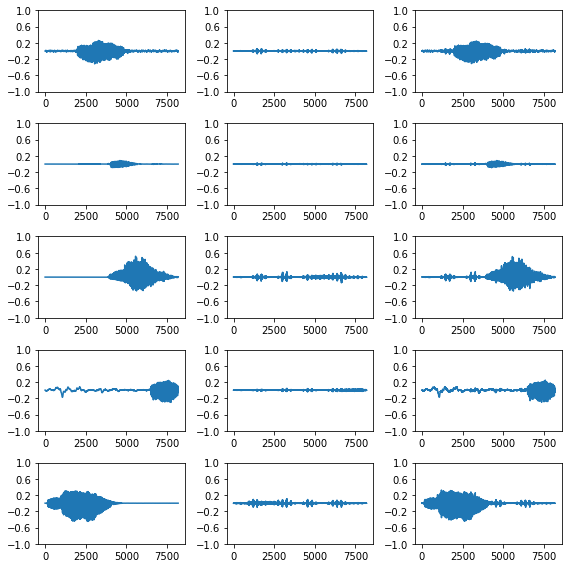

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1987 - g_loss: 3.9824 - g_gan_loss: 2.8482 - g_adv_loss: 0.0667 - g_perturb_loss: 1.0675
Epoch 31/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 3.8989 - g_gan_loss: 2.8477 - g_adv_loss: 0.0454 - g_perturb_loss: 1.0058

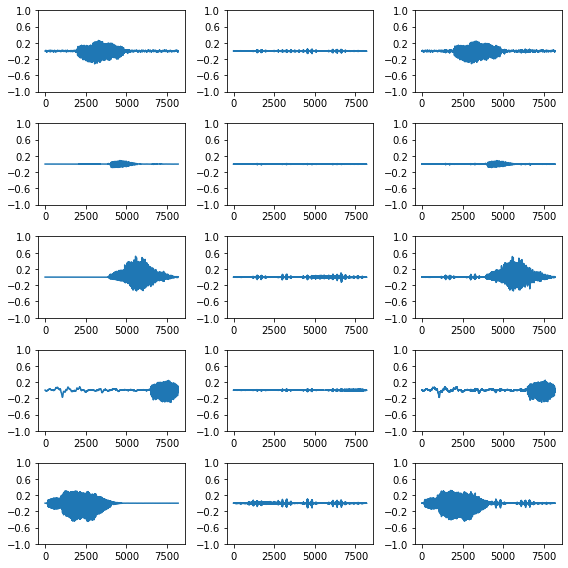

218/218 [==============================] - 117s 536ms/step - d_loss: 0.1987 - g_loss: 3.8990 - g_gan_loss: 2.8476 - g_adv_loss: 0.0452 - g_perturb_loss: 1.0061
Epoch 32/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.9603 - g_gan_loss: 2.8477 - g_adv_loss: 0.0961 - g_perturb_loss: 1.0164

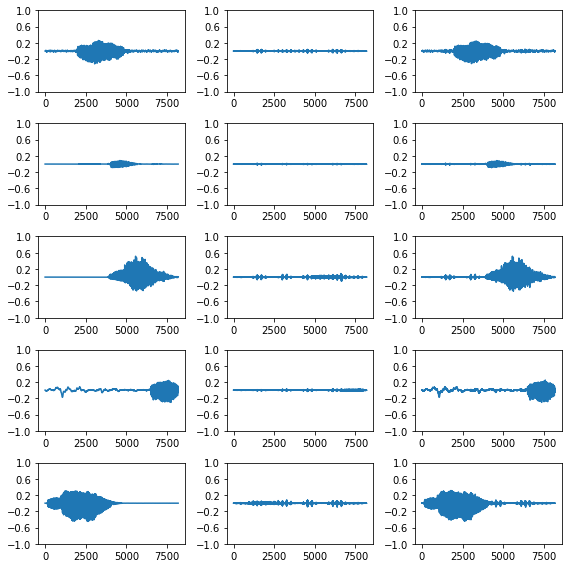

218/218 [==============================] - 117s 535ms/step - d_loss: 0.1986 - g_loss: 3.9594 - g_gan_loss: 2.8476 - g_adv_loss: 0.0957 - g_perturb_loss: 1.0160
Epoch 33/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.9264 - g_gan_loss: 2.8483 - g_adv_loss: 0.0589 - g_perturb_loss: 1.0193

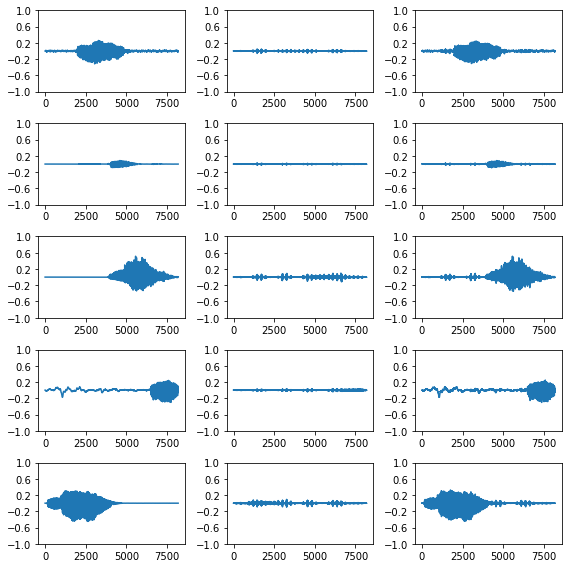

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1986 - g_loss: 3.9263 - g_gan_loss: 2.8482 - g_adv_loss: 0.0586 - g_perturb_loss: 1.0195
Epoch 34/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 3.9651 - g_gan_loss: 2.8471 - g_adv_loss: 0.0676 - g_perturb_loss: 1.0504

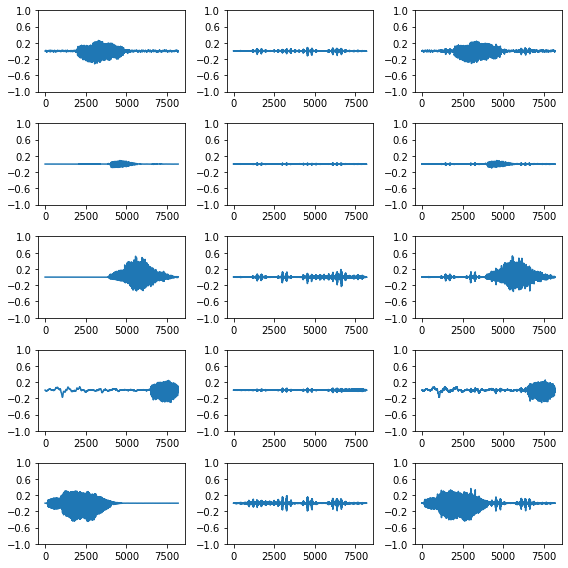

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1987 - g_loss: 3.9674 - g_gan_loss: 2.8471 - g_adv_loss: 0.0673 - g_perturb_loss: 1.0530
Epoch 35/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.8978 - g_gan_loss: 2.8474 - g_adv_loss: 0.0769 - g_perturb_loss: 0.9734

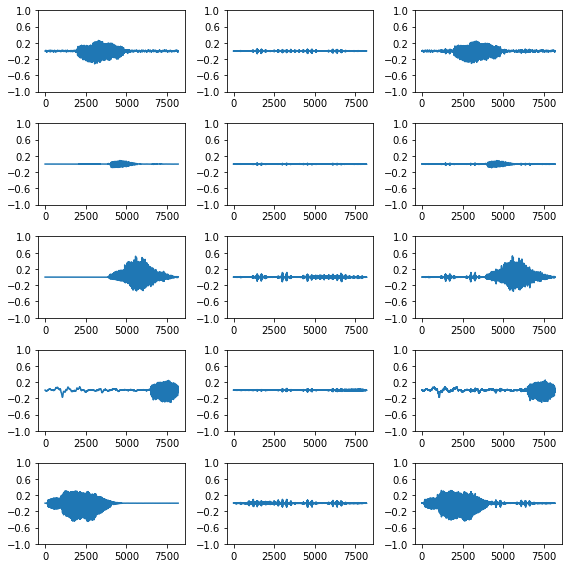

218/218 [==============================] - 117s 537ms/step - d_loss: 0.1986 - g_loss: 3.8981 - g_gan_loss: 2.8474 - g_adv_loss: 0.0766 - g_perturb_loss: 0.9741
Epoch 36/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.8096 - g_gan_loss: 2.8479 - g_adv_loss: 0.0533 - g_perturb_loss: 0.9084

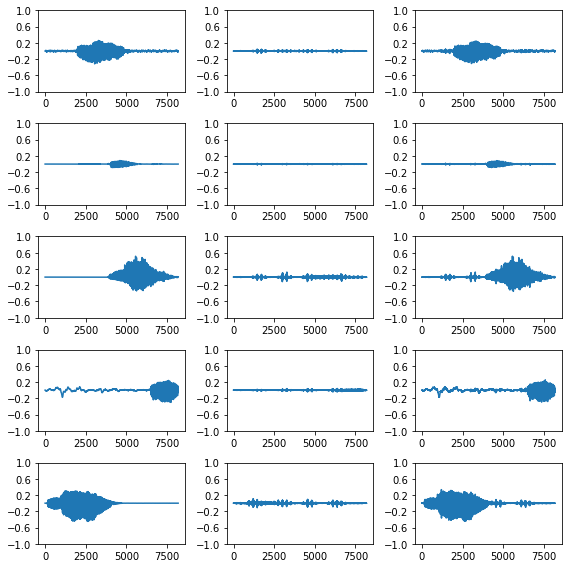

218/218 [==============================] - 117s 535ms/step - d_loss: 0.1986 - g_loss: 3.8104 - g_gan_loss: 2.8478 - g_adv_loss: 0.0536 - g_perturb_loss: 0.9091
Epoch 37/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 3.8982 - g_gan_loss: 2.8480 - g_adv_loss: 0.0425 - g_perturb_loss: 1.0076

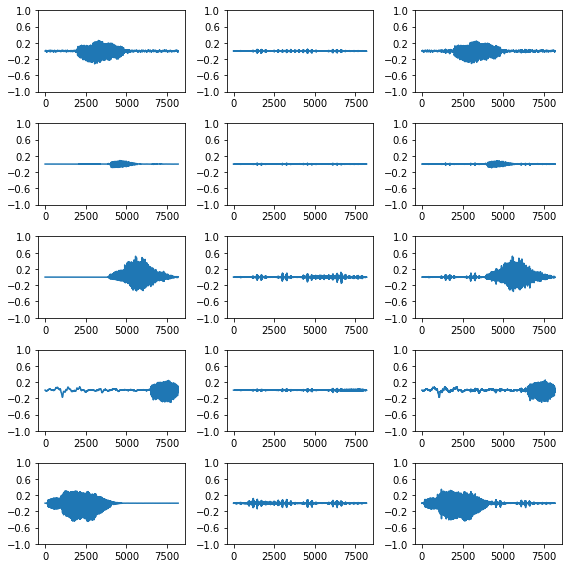

218/218 [==============================] - 117s 536ms/step - d_loss: 0.1987 - g_loss: 3.8987 - g_gan_loss: 2.8480 - g_adv_loss: 0.0423 - g_perturb_loss: 1.0084
Epoch 38/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 3.8502 - g_gan_loss: 2.8458 - g_adv_loss: 0.0729 - g_perturb_loss: 0.9315

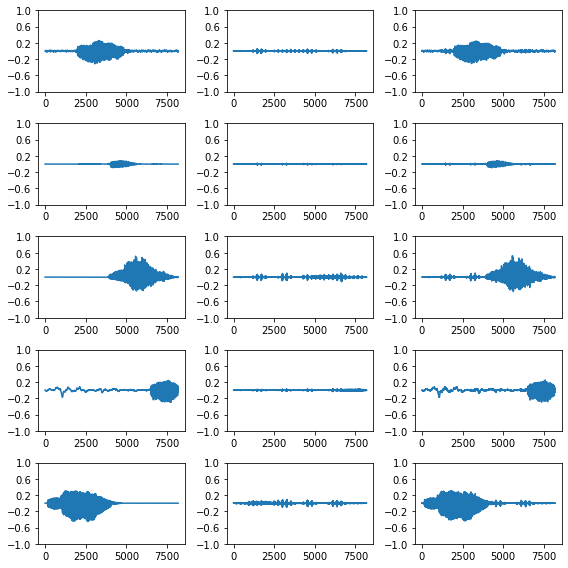

218/218 [==============================] - 117s 535ms/step - d_loss: 0.1987 - g_loss: 3.8500 - g_gan_loss: 2.8458 - g_adv_loss: 0.0726 - g_perturb_loss: 0.9316
Epoch 39/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.9369 - g_gan_loss: 2.8484 - g_adv_loss: 0.0669 - g_perturb_loss: 1.0216

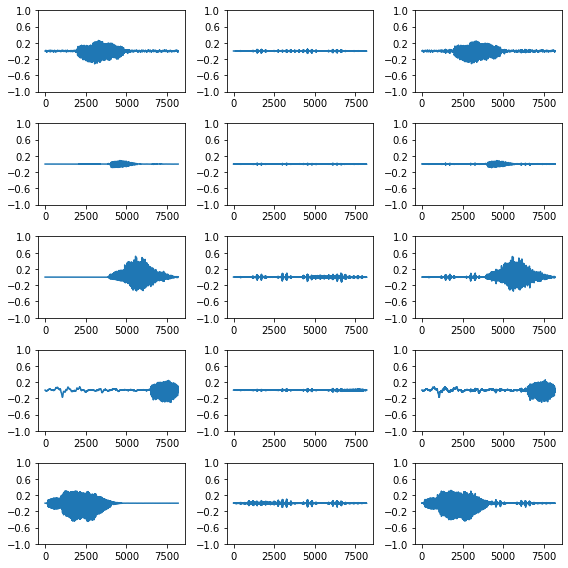

218/218 [==============================] - 117s 535ms/step - d_loss: 0.1986 - g_loss: 3.9370 - g_gan_loss: 2.8484 - g_adv_loss: 0.0666 - g_perturb_loss: 1.0220
Epoch 40/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 3.8082 - g_gan_loss: 2.8447 - g_adv_loss: 0.0581 - g_perturb_loss: 0.9053

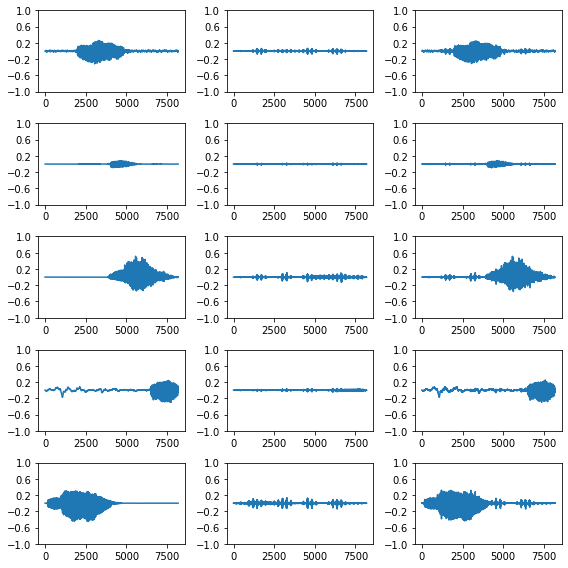

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1987 - g_loss: 3.8094 - g_gan_loss: 2.8447 - g_adv_loss: 0.0579 - g_perturb_loss: 0.9068
Epoch 41/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.7983 - g_gan_loss: 2.8484 - g_adv_loss: 0.0662 - g_perturb_loss: 0.8838

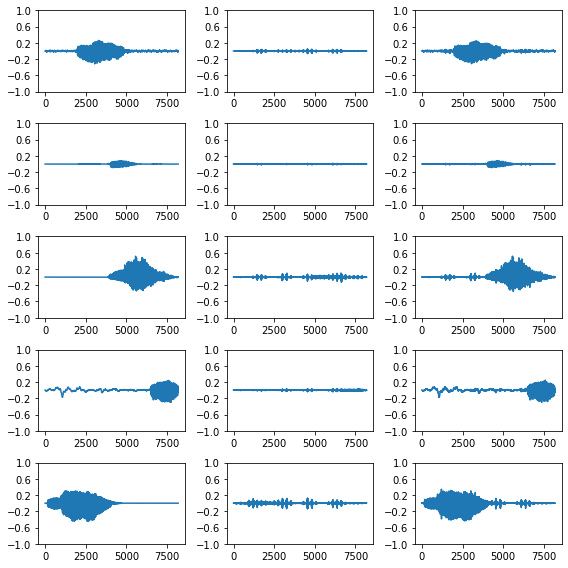

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1986 - g_loss: 3.7992 - g_gan_loss: 2.8483 - g_adv_loss: 0.0659 - g_perturb_loss: 0.8850
Epoch 42/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.8563 - g_gan_loss: 2.8484 - g_adv_loss: 0.0450 - g_perturb_loss: 0.9628

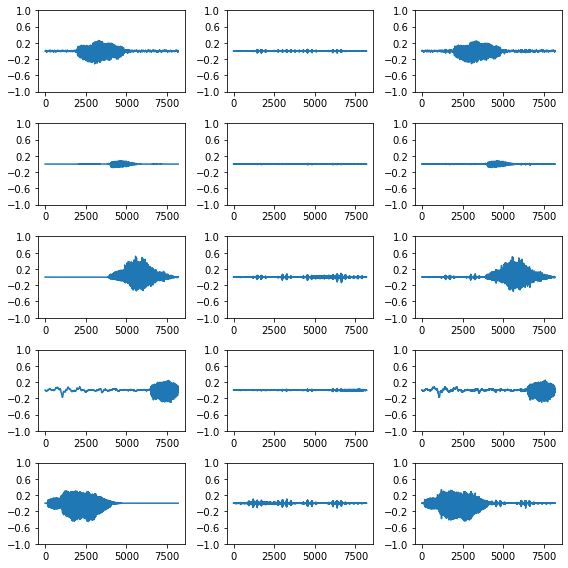

218/218 [==============================] - 117s 537ms/step - d_loss: 0.1986 - g_loss: 3.8560 - g_gan_loss: 2.8482 - g_adv_loss: 0.0448 - g_perturb_loss: 0.9630
Epoch 43/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.8676 - g_gan_loss: 2.8479 - g_adv_loss: 0.0727 - g_perturb_loss: 0.9469

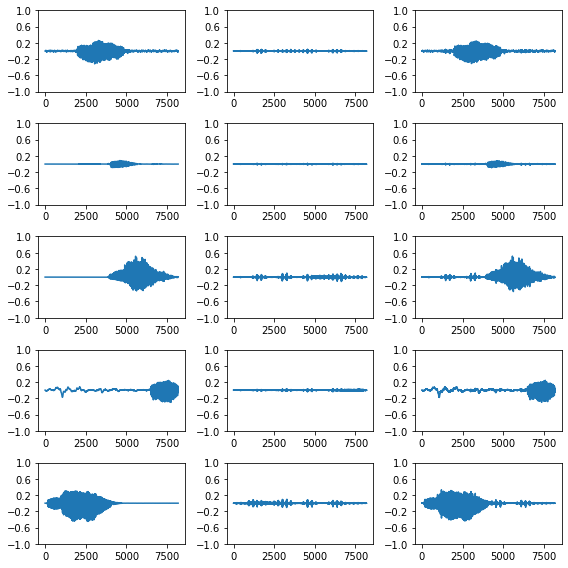

218/218 [==============================] - 117s 535ms/step - d_loss: 0.1986 - g_loss: 3.8675 - g_gan_loss: 2.8479 - g_adv_loss: 0.0724 - g_perturb_loss: 0.9472
Epoch 44/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.7754 - g_gan_loss: 2.8483 - g_adv_loss: 0.0578 - g_perturb_loss: 0.8693

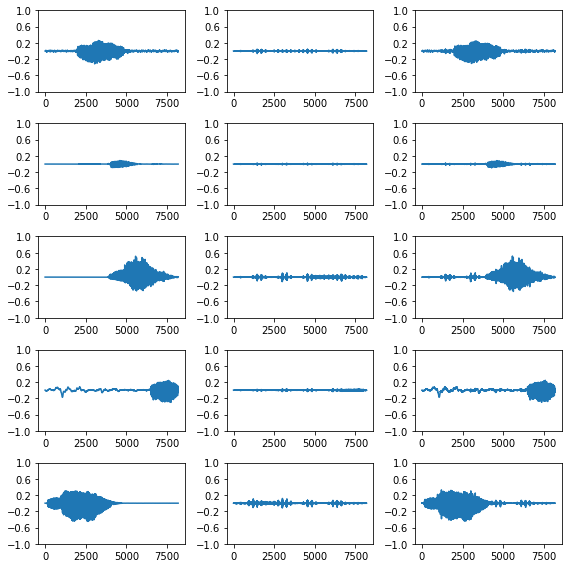

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1986 - g_loss: 3.7757 - g_gan_loss: 2.8482 - g_adv_loss: 0.0576 - g_perturb_loss: 0.8699
Epoch 45/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1990 - g_loss: 3.8023 - g_gan_loss: 2.8455 - g_adv_loss: 0.0519 - g_perturb_loss: 0.9049

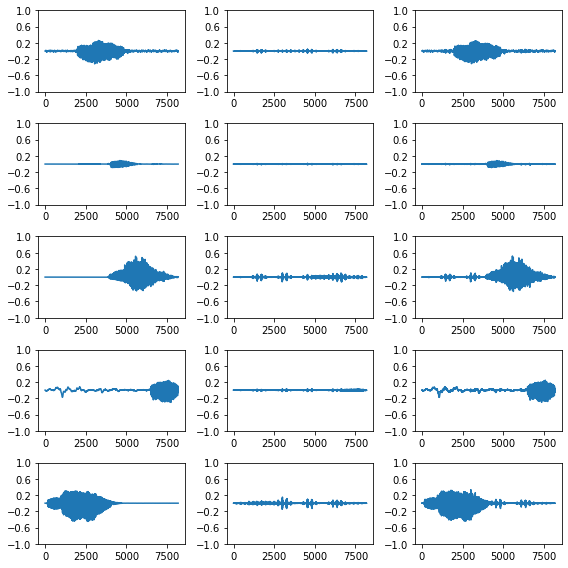

218/218 [==============================] - 117s 534ms/step - d_loss: 0.1990 - g_loss: 3.8021 - g_gan_loss: 2.8445 - g_adv_loss: 0.0516 - g_perturb_loss: 0.9060
Epoch 46/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2008 - g_loss: 3.8534 - g_gan_loss: 2.8125 - g_adv_loss: 0.0609 - g_perturb_loss: 0.9800

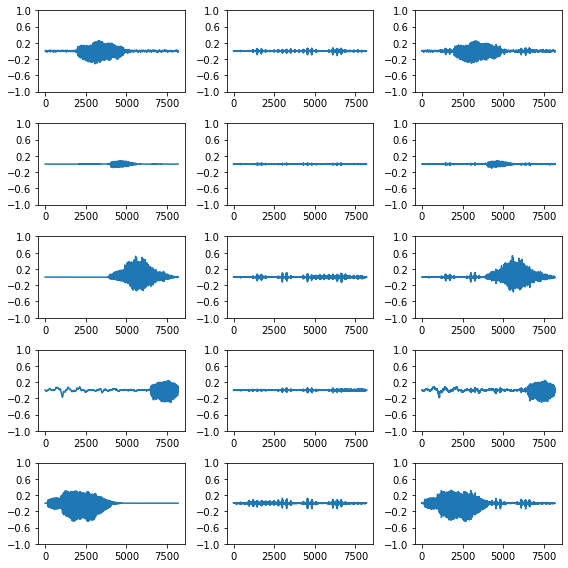

218/218 [==============================] - 117s 535ms/step - d_loss: 0.2008 - g_loss: 3.8548 - g_gan_loss: 2.8125 - g_adv_loss: 0.0607 - g_perturb_loss: 0.9816
Epoch 47/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1988 - g_loss: 3.9163 - g_gan_loss: 2.8450 - g_adv_loss: 0.0850 - g_perturb_loss: 0.9863

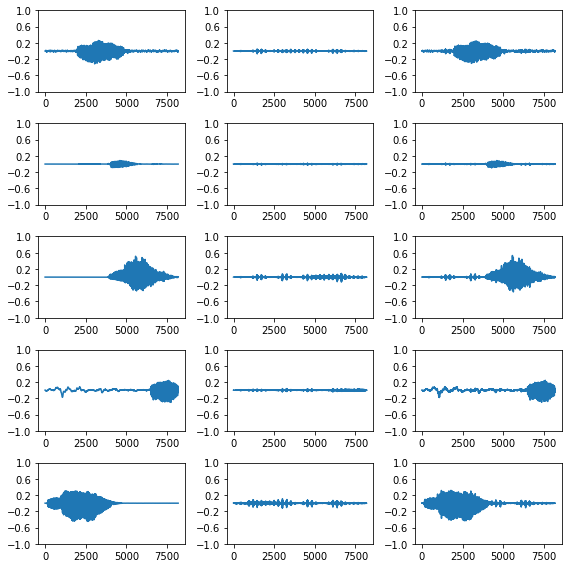

218/218 [==============================] - 117s 535ms/step - d_loss: 0.1988 - g_loss: 3.9160 - g_gan_loss: 2.8447 - g_adv_loss: 0.0846 - g_perturb_loss: 0.9867
Epoch 48/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.8730 - g_gan_loss: 2.8496 - g_adv_loss: 0.0580 - g_perturb_loss: 0.9654

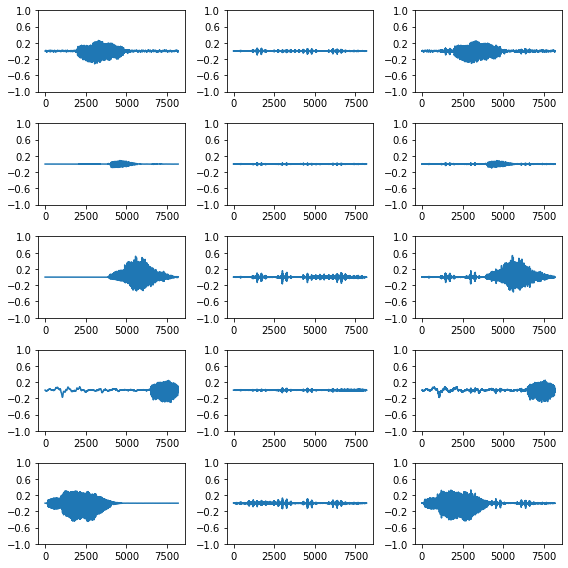

218/218 [==============================] - 117s 537ms/step - d_loss: 0.1986 - g_loss: 3.8744 - g_gan_loss: 2.8495 - g_adv_loss: 0.0577 - g_perturb_loss: 0.9672
Epoch 49/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.8414 - g_gan_loss: 2.8491 - g_adv_loss: 0.0559 - g_perturb_loss: 0.9365

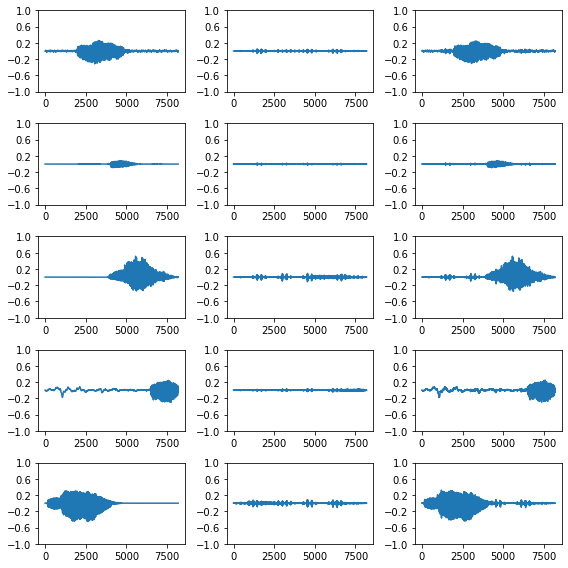

218/218 [==============================] - 117s 536ms/step - d_loss: 0.1986 - g_loss: 3.8413 - g_gan_loss: 2.8489 - g_adv_loss: 0.0556 - g_perturb_loss: 0.9368
Epoch 50/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 3.7955 - g_gan_loss: 2.8491 - g_adv_loss: 0.0522 - g_perturb_loss: 0.8941

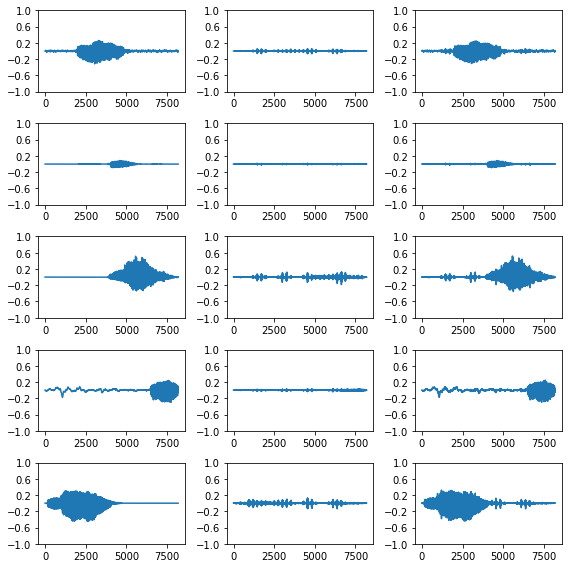

218/218 [==============================] - 117s 535ms/step - d_loss: 0.1986 - g_loss: 3.7971 - g_gan_loss: 2.8490 - g_adv_loss: 0.0520 - g_perturb_loss: 0.8961


In [ ]:
history = advgan.fit(
    dataset,
    epochs=50,
    callbacks=[callback],
)

In [ ]:
weights_path = f'{WEIGHTS_DIR}/{BASE_FILENAME}_{time.strftime("%Y%m%d%H%M%S")}.h5'
advgan.save_weights(weights_path)

print(f'Weights saved as {weights_path}')

Weights saved as weights/advgan_sc_20220604211256.h5


In [ ]:
weights_path = f'{WEIGHTS_DIR}/{BASE_FILENAME}_g_{time.strftime("%Y%m%d%H%M%S")}.h5'
generator.save_weights(weights_path)

print(f'Weights saved as {weights_path}')

Weights saved as weights/advgan_sc_g_20220604211257.h5


Plot the generator and discriminator losses through the epochs:

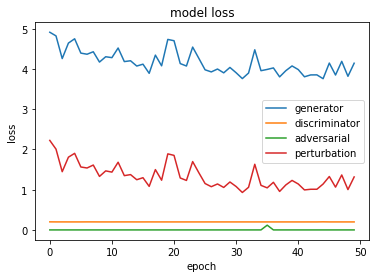

In [ ]:
plt.plot(history.history['g_loss'])
plt.plot(history.history['d_loss'])
plt.plot(history.history['g_adv_loss'])
plt.plot(history.history['g_perturb_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['generator', 'discriminator', 'adversarial', 'perturbation'], loc='best')

plt.show()

Plot the generator's progress through the epochs:


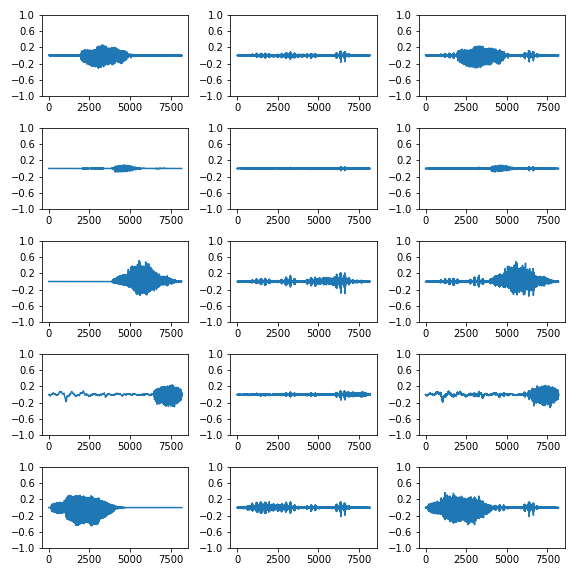

In [ ]:
import tensorflow_docs.vis.embed as embed

image_pattern = f'{AUDIO_DIR}/{BASE_FILENAME}*.png'
gif_path = f'{AUDIO_DIR}/{BASE_FILENAME}.gif'

images_to_gif(image_pattern, gif_path, delete_frames=True)
embed.embed_file(gif_path)

### Classifying generated audio using `SCConvTarget`

We'll test the generator's performance by classifying the adversarial audio it creates for the test set using the `MNISTConvTarget` model.

In [ ]:
test_audio = []
test_labels = []

for audio, label in test_data:
    test_audio.append(audio.numpy())
    test_labels.append(label.numpy())

test_audio = np.array(test_audio)
test_labels = np.array(test_labels)

In [ ]:
adv_audio, perturbations = generate_adv_examples(
    generator,
    test_audio,
    perturb_bound=PERTURB_BOUND
)

In [ ]:
probs = target.predict(adv_audio)

In [ ]:
predictions = probs.argmax(axis=1)

Display and classify adversarial audio examples obtained for a sample of 5 audio examples:

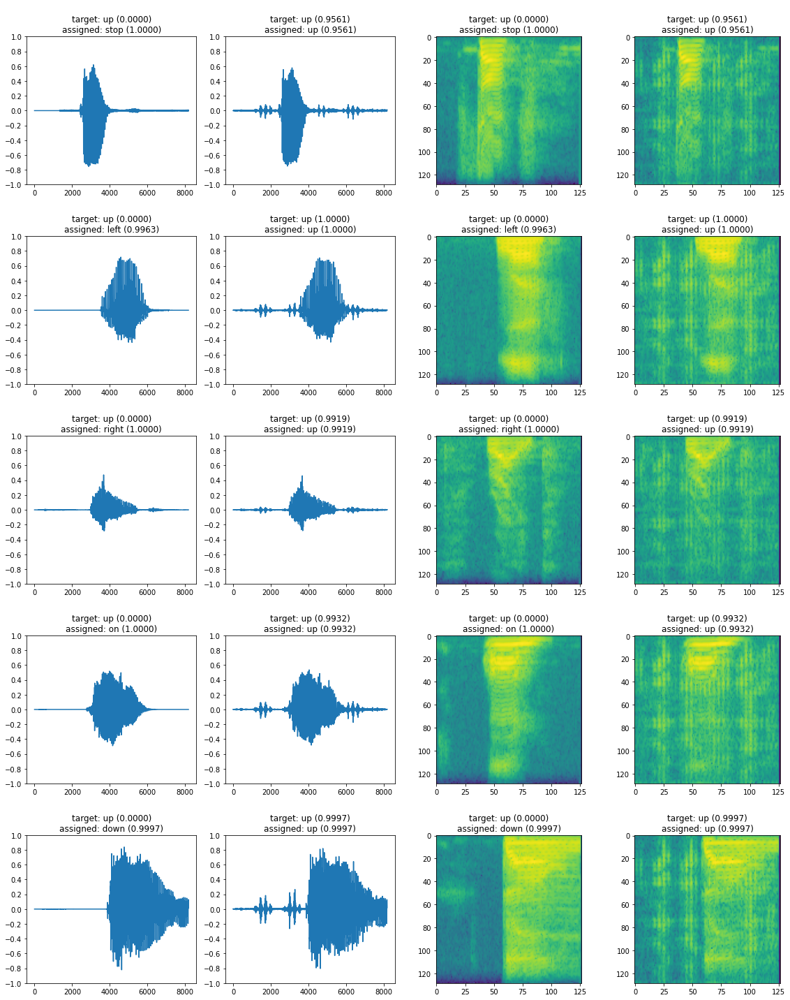

In [ ]:
plot_audio_results(
    test_audio[:5],
    adv_audio[:5],
    INPUT_SHAPE[0],
    target,
    TARGET_LABEL,
    label2idx=info.features['label'].str2int,
    idx2label=info.features['label'].int2str
)

#### Attack success rate

In [ ]:
target_idx = info.features['label'].names.index(TARGET_LABEL)

In [ ]:
asr = (predictions == target_idx).sum() / len(predictions)

print(f'Attack success rate: {asr * 100:.2f}%')

Attack success rate: 99.97%


#### Average probability of target prediction

In [ ]:
avg_prob = probs[:, target_idx].mean()

print(f'Average probability of predicting "{TARGET_LABEL}": {avg_prob:.4f}')

Average probability of predicting "up": 0.9951


#### Average perturbation strength ($L_2$-norm)

In [ ]:
reshaped = tf.reshape(perturbations, (tf.shape(perturbations)[0], -1))
avg_perturb_strength = tf.reduce_mean(tf.norm(reshaped, axis=1)).numpy()

print(f'Average perturbation strength: {avg_perturb_strength:.4f}')

Average perturbation strength: 1.1401


#### Attack confusion matrix

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:194: RuntimeWarning: invalid value encountered in true_divide


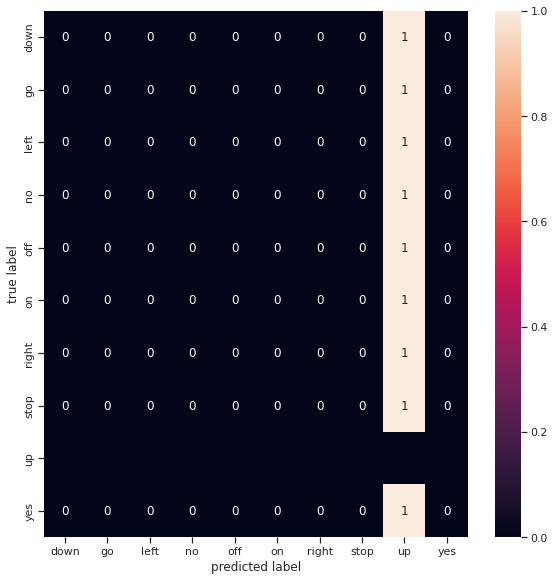

In [ ]:
plot_confusion_matrix(
    test_labels,
    predictions,
    classes=info.features['label'].names[:-2],
    ignore_idx=target_idx
)